In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg 
from glob import glob

**The first step is to callibrate the camera, and correct for distortion.**

**To start, we need to find the chessboard corners on the images. These corners will be displayed on a separate window.**

In [4]:
# importing the images
images = [cv2.imread(image) for image in glob("camera_cal/calibration*.jpg")]

# The size od=f all images
height, width = images[0].shape[:2]

pattern = (9, 6)

# The coordinates of the corners in the real world, measured in squares (length of a square side)
# (x, y, z) for each corner, with z=0 for all of them, for simplicity.
real_corners = np.zeros((pattern[0]*pattern[1], 3), np.float32)
real_corners[:, :2] = np.mgrid[0:pattern[0], 0:pattern[1]].T.reshape(-1, 2)

# Stores the real corner coordinates for each chessboard. 
# All will have the same set of coordinates [(0, 0, 0), (1, 0, 0), (x, y, z)], 
# where (x, y, z) are measured in squares 
object_points = []

# This will contain the coordinates of the corners of each chessboard image.
# Since all images are different, the coordinates will be different.
# The coordinates are measured in pixels.
image_points = []

show_images = True
interactive = False

for i, img in enumerate(images):
    # image = cv2.imread(img)
    image = np.copy(img)
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, pattern)

    if ret:
        image_points.append(corners)
        object_points.append(real_corners)
        cv2.drawChessboardCorners(image, pattern, corners, ret)

        if show_images:
            cv2.imshow("Chessboard corners", image)
            key = None

            if interactive:
                # if the program is interactive, wait forever until a key is pressed
                key = cv2.waitKey(0)
                # Next image wil will be shown when the user presses the spacebar
                if key == ord(' '):
                    continue
            else:
                key = cv2.waitKey(500)

            # if the user quits, no more images will be show, but corners will still be appended.
            if key == ord('q'):
                show_images = False

cv2.destroyAllWindows()

**These corners can be used to find the camera matrix and the distortion coefficients.**

In [6]:
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(object_points, image_points, (width, height), None, None)

**The matrix `mtx` and the distortion coefficients `dist` can be used to undistort the images. A test is done below.**

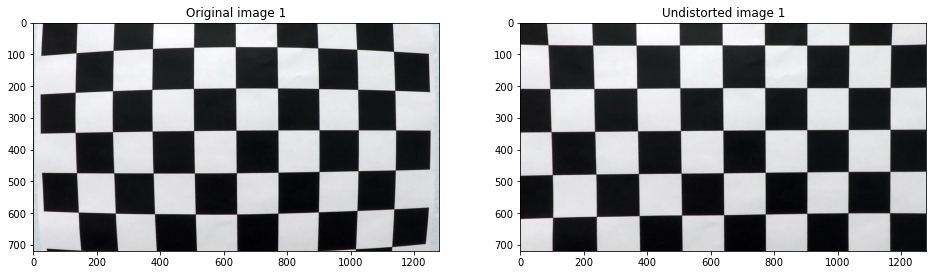

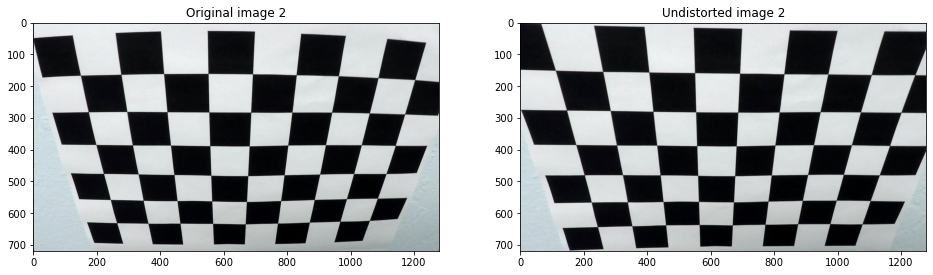

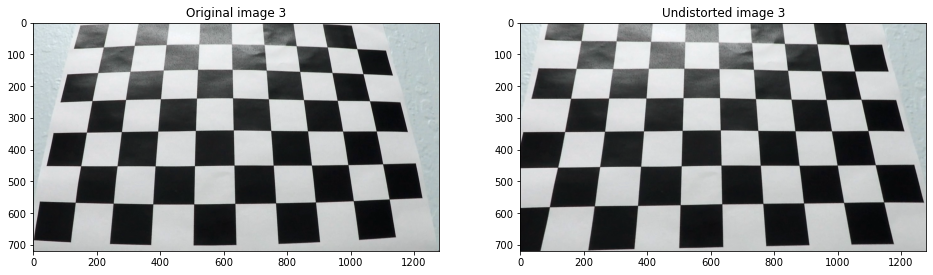

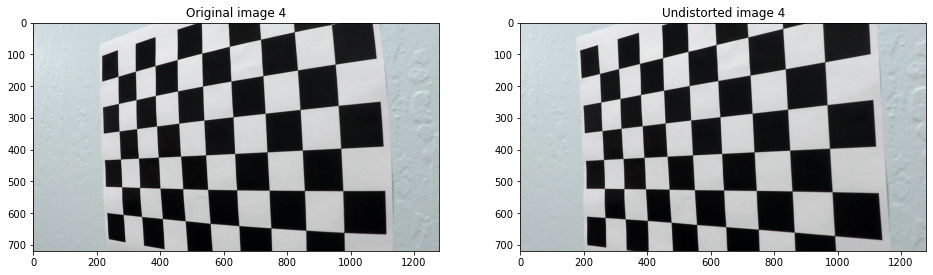

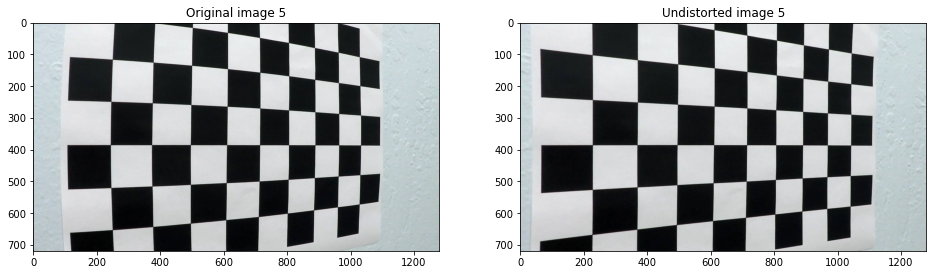

...

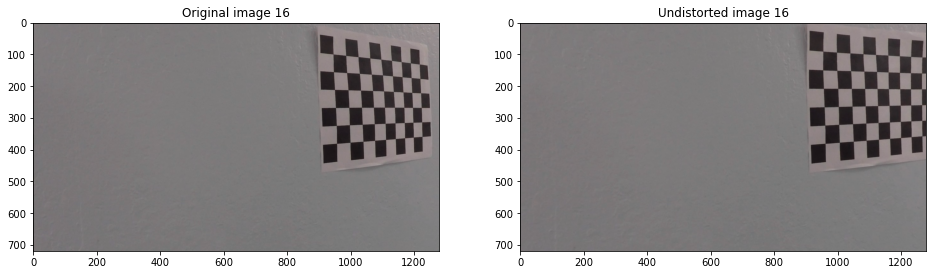

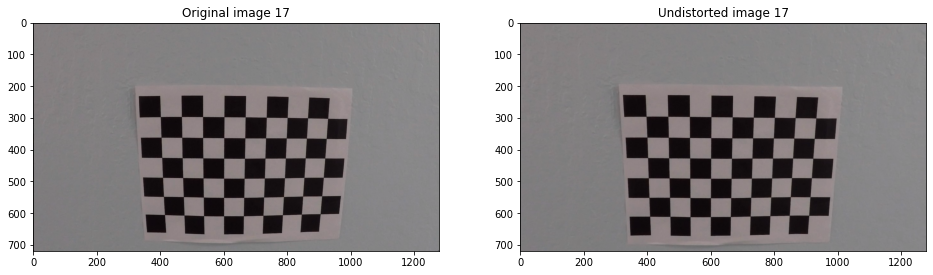

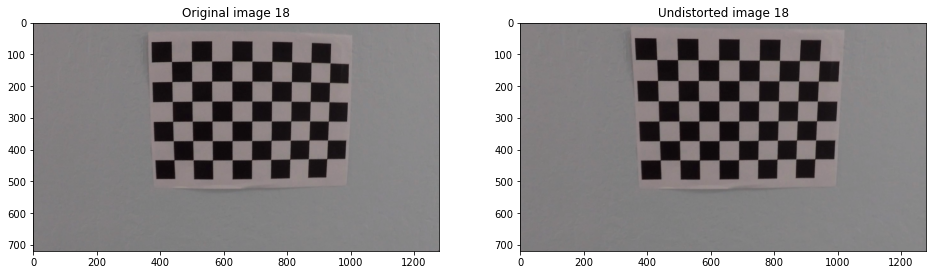

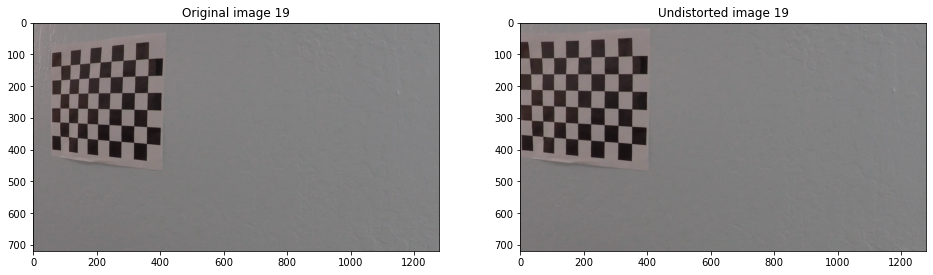

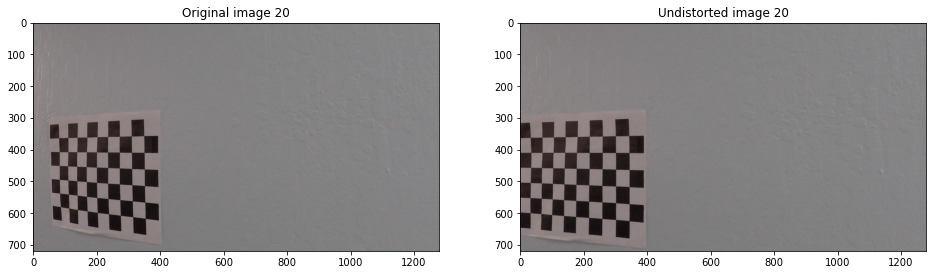

In [9]:
for i, image in enumerate(images):
    undistorted = cv2.undistort(image, mtx, dist)
    f, (left, right) = plt.subplots(1, 2, figsize=(16, 9))
    left.set_title("Original image "+str(i+1))
    left.imshow(image)
    right.set_title("Undistorted image "+str(i+1))
    right.imshow(undistorted)
    

**It looks like the undistortion and camera calibration were successful. This means that the camera matrix `mtx` and the distortion coefficients `dist` obtained earlier are suitable to undistort the images from the road.**